In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/underwater3/Test/Reference/4_img_.png
/kaggle/input/underwater3/Test/Reference/537_img_.png
/kaggle/input/underwater3/Test/Reference/722_img_.png
/kaggle/input/underwater3/Test/Reference/366_img_.png
/kaggle/input/underwater3/Test/Reference/432_img_.png
/kaggle/input/underwater3/Test/Reference/381_img_.png
/kaggle/input/underwater3/Test/Reference/207_img_.png
/kaggle/input/underwater3/Test/Reference/90_img_.png
/kaggle/input/underwater3/Test/Reference/98_img_.png
/kaggle/input/underwater3/Test/Reference/270_img_.png
/kaggle/input/underwater3/Test/Reference/589_img_.png
/kaggle/input/underwater3/Test/Reference/292_img_.png
/kaggle/input/underwater3/Test/Reference/18_img_.png
/kaggle/input/underwater3/Test/Reference/373_img_.png
/kaggle/input/underwater3/Test/Reference/887_img_.png
/kaggle/input/underwater3/Test/Reference/3650.png
/kaggle/input/underwater3/Test/Reference/651.png
/kaggle/input/underwater3/Test/Reference/360_img_.png
/kaggle/input/underwater3/Test/Reference/6

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image


In [2]:
# Paths for raw and reference images
raw_images_path = "/kaggle/input/underwater3/Train/Raw"
reference_images_path = "/kaggle/input/underwater3/Train/Reference"


In [3]:
def load_images(raw_path, reference_path):
    raw_images = []
    reference_images = []

    for filename in os.listdir(raw_path):
        if filename.endswith('.jpg') or filename.endswith('.png'):  # Adjust file types as needed
            # Load raw image
            raw_image = tf.keras.preprocessing.image.load_img(os.path.join(raw_path, filename), target_size=(128, 128))
            raw_image = tf.keras.preprocessing.image.img_to_array(raw_image) / 255.0  # Normalize
            raw_images.append(raw_image)

            # Load reference image (enhanced version)
            reference_image = tf.keras.preprocessing.image.load_img(os.path.join(reference_path, filename), target_size=(128, 128))
            reference_image = tf.keras.preprocessing.image.img_to_array(reference_image) / 255.0  # Normalize
            reference_images.append(reference_image)

    return np.array(raw_images), np.array(reference_images)

raw_images, reference_images = load_images(raw_images_path, reference_images_path)


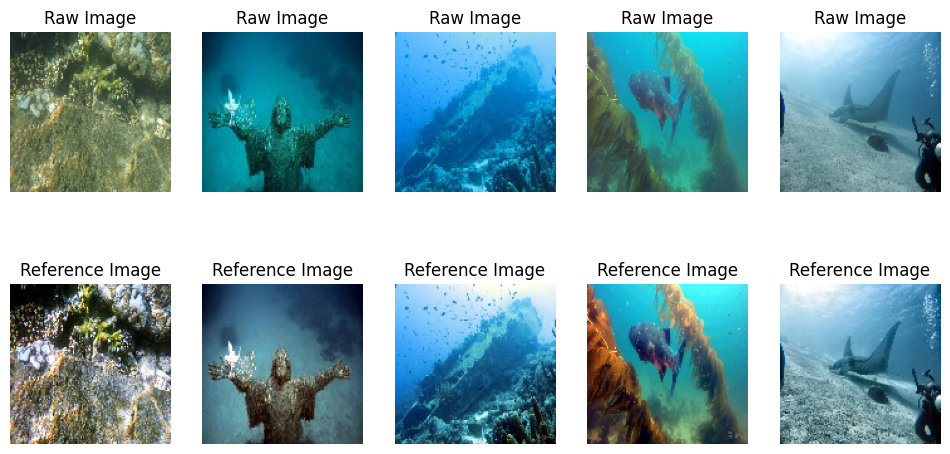

In [10]:
def display_images(raw, reference, num_images=5):
    plt.figure(figsize=(12, 6))
    
    for i in range(num_images):
        # Display raw images
        plt.subplot(2, num_images, i + 1)
        plt.imshow(raw[i])
        plt.title("Raw Image")
        plt.axis('off')

        # Display reference images
        plt.subplot(2, num_images, i + 1 + num_images)
        plt.imshow(reference[i])
        plt.title("Reference Image")
        plt.axis('off')

    plt.show()

display_images(raw_images, reference_images)


In [12]:
def build_generator():
    inputs = layers.Input(shape=(128, 128, 3))

    # Convolutional layers
    x = layers.Conv2D(64, kernel_size=9, padding='same')(inputs)
    x = layers.PReLU()(x)

    # Residual blocks
    for _ in range(16):
        res = layers.Conv2D(64, kernel_size=3, padding='same')(x)
        res = layers.PReLU()(res)
        res = layers.Conv2D(64, kernel_size=3, padding='same')(res)
        x = layers.add([x, res])

    # Upsampling
    x = layers.Conv2D(64, kernel_size=3, padding='same')(x)
#     x = layers.UpSampling2D(size=2)(x)
    x = layers.PReLU()(x)
    x = layers.Conv2D(3, kernel_size=9, padding='same')(x)

    return Model(inputs, x)

generator = build_generator()
generator.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_35 (Conv2D)  │ (None, 128, 128,  │     15,616 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_18 (PReLU)  │ (None, 128, 128,  │  1,048,576 │ conv2d_35[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_36 (Conv2D)  │ (None, 128, 128,  │     36,928 │ p_re_lu_18[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_19 (PReLU)  │ (None, 128, 128,  │  1,048,576 │ conv2d_36[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 128, 128,  │     36,928 │ p_re_lu_19[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_16 (Add)        │ (None, 128, 128,  │          0 │ p_re_lu_18[0][0], │
│                     │ 64)               │            │ conv2d_37[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 128, 128,  │     36,928 │ add_16[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_20 (PReLU)  │ (None, 128, 128,  │  1,048,576 │ conv2d_38[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 128, 128,  │     36,928 │ p_re_lu_20[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_17 (Add)        │ (None, 128, 128,  │          0 │ add_16[0][0],     │
│                     │ 64)               │            │ conv2d_39[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 128, 128,  │     36,928 │ add_17[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_21 (PReLU)  │ (None, 128, 128,  │  1,048,576 │ conv2d_40[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 128, 128,  │     36,928 │ p_re_lu_21[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_18 (Add)        │ (None, 128, 128,  │          0 │ add_17[0][0],     │
│                     │ 64)               │            │ conv2d_41[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 128, 128,  │     36,928 │ add_18[0][0]      │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ p_re_lu_22 (PReLU)  │ (None, 128, 128,  │  1,048,576 │ conv2d_42[0][0] 

 Total params: 20,124,163 (76.77 MB)

 Trainable params: 20,124,163 (76.77 MB)

 Non-trainable params: 0 (0.00 B)

In [13]:
def build_discriminator():
    inputs = layers.Input(shape=(128, 128, 3))

    x = layers.Conv2D(64, kernel_size=3, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, kernel_size=3, strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, kernel_size=3, strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(512, kernel_size=3, strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1, activation='sigmoid')(x)

    return Model(inputs, x)

discriminator = build_discriminator()
discriminator.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 64, 64, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_72 (Conv2D)              │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_73 (Conv2D)              │ (None, 8, 8, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │        32,769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,583,745 (6.04 MB)

 Trainable params: 1,583,745 (6.04 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
# def build_vgg():
#     base_model= VGG19(weights='imagenet', include_top=False)
#     return Model(inputs=base_model.input, outputs=base_model.output)

In [14]:
class SRGAN:
    def __init__(self):
        self.generator = build_generator()
        self.discriminator = build_discriminator()
        self.mse = tf.keras.losses.MeanSquaredError()  # Use MSE for image loss

    def img_loss(self, x_real, x_fake):
        return self.mse(x_real, x_fake)

    def adv_loss(self, preds, is_real):
        target = tf.ones_like(preds) if is_real else tf.zeros_like(preds)
        return tf.keras.losses.binary_crossentropy(target, preds)

    def train_step(self, hr_real, lr_real):
        with tf.GradientTape() as g_tape, tf.GradientTape() as d_tape:
            hr_fake = self.generator(lr_real)

            fake_preds_for_g = self.discriminator(hr_fake)
            fake_preds_for_d = self.discriminator(hr_fake)
            real_preds_for_d = self.discriminator(hr_real)

            # Compute generator loss (without VGG perceptual loss)
            g_loss = (
                0.001 * self.adv_loss(fake_preds_for_g, True) + 
                self.img_loss(hr_real, hr_fake)
            )

            # Compute discriminator loss
            d_loss = 0.5 * (
                self.adv_loss(real_preds_for_d, True) + 
                self.adv_loss(fake_preds_for_d, False)
            )

        # Compute gradients and apply them
        g_gradients = g_tape.gradient(g_loss, self.generator.trainable_variables)
        d_gradients = d_tape.gradient(d_loss, self.discriminator.trainable_variables)

        optimizer_g.apply_gradients(zip(g_gradients, self.generator.trainable_variables))
        optimizer_d.apply_gradients(zip(d_gradients, self.discriminator.trainable_variables))

        return g_loss, d_loss, hr_fake

    def train(self, epochs=20000, batch_size=16):
        for epoch in range(epochs):
            idx = np.random.randint(0, raw_images.shape[0], batch_size)
            hr_batch = reference_images[idx]
            lr_batch = raw_images[idx]

            g_loss, d_loss, hr_fake = self.train_step(hr_batch, lr_batch)

            if epoch % 10 == 0:
                print(f"Epoch {epoch}, Discriminator Loss: {d_loss.numpy()}, Generator Loss: {g_loss.numpy()}")

            if epoch % 50 == 0:
                self.display_generated_images(lr_batch[:5], hr_batch[:5], hr_fake[:5])

    def display_generated_images(self, lr_batch, hr_batch, hr_fake):
        plt.figure(figsize=(12, 12))
        for i in range(5):
            plt.subplot(3, 5, i + 1)
            plt.imshow(lr_batch[i])
            plt.title('Low Res')
            plt.axis('off')

            plt.subplot(3, 5, i + 6)
            plt.imshow(hr_batch[i])
            plt.title('High Res')
            plt.axis('off')

            plt.subplot(3, 5, i + 11)
            plt.imshow(hr_fake[i])
            plt.title('Generated')
            plt.axis('off')
        plt.show()


In [15]:
# Adding optimizers to both generator and discriminator.
srgan = SRGAN()
optimizer_g = tf.keras.optimizers.Adam(learning_rate=1e-4)
optimizer_d = tf.keras.optimizers.Adam(learning_rate=1e-4)


In [16]:
tf.keras.backend.clear_session()


Epoch 0, Discriminator Loss: [0.72473025 0.73060423 0.7375915  0.7276844  0.7368219  0.719664
 0.72086036 0.72633   ], Generator Loss: [4.812447  4.81244   4.8124313 4.8124447 4.8124304 4.8124514 4.812459
 4.812443 ]


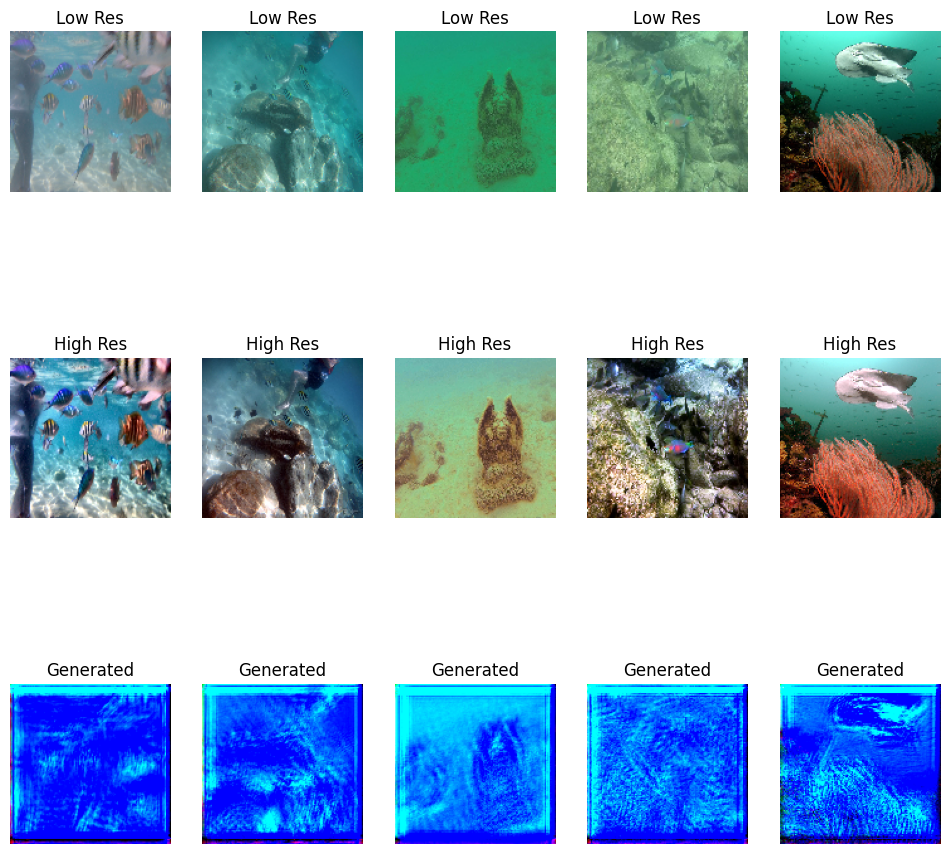

Epoch 10, Discriminator Loss: [0.6799183  0.69296134 0.68499607 0.68581176 0.7023938  0.68956244
 0.66524357 0.6947328 ], Generator Loss: [0.19774683 0.19772755 0.19776116 0.1977098  0.1977577  0.1977361
 0.19779785 0.197691  ]
Epoch 20, Discriminator Loss: [0.6726326  0.6461152  0.62588906 0.6728599  0.6583829  0.63836
 0.6636474  0.65925694], Generator Loss: [0.09107062 0.09112119 0.09112535 0.09110004 0.091098   0.09111007
 0.09106576 0.09112816]
Epoch 30, Discriminator Loss: [0.6044906  0.61475015 0.6497882  0.7163849  0.68884254 0.6538336
 0.67083657 0.65934885], Generator Loss: [0.05338729 0.0533981  0.05333252 0.05329298 0.05333246 0.05332779
 0.05329791 0.05335151]
Epoch 40, Discriminator Loss: [0.5397301  0.63832414 0.65200067 0.6233977  0.6203353  0.6275357
 0.7470683  0.6122688 ], Generator Loss: [0.03952615 0.03948096 0.03943878 0.03946636 0.03938034 0.03941552
 0.03950327 0.03935717]
Epoch 50, Discriminator Loss: [0.5194516  0.6135503  0.65503454 0.637079   0.6005584  0.60

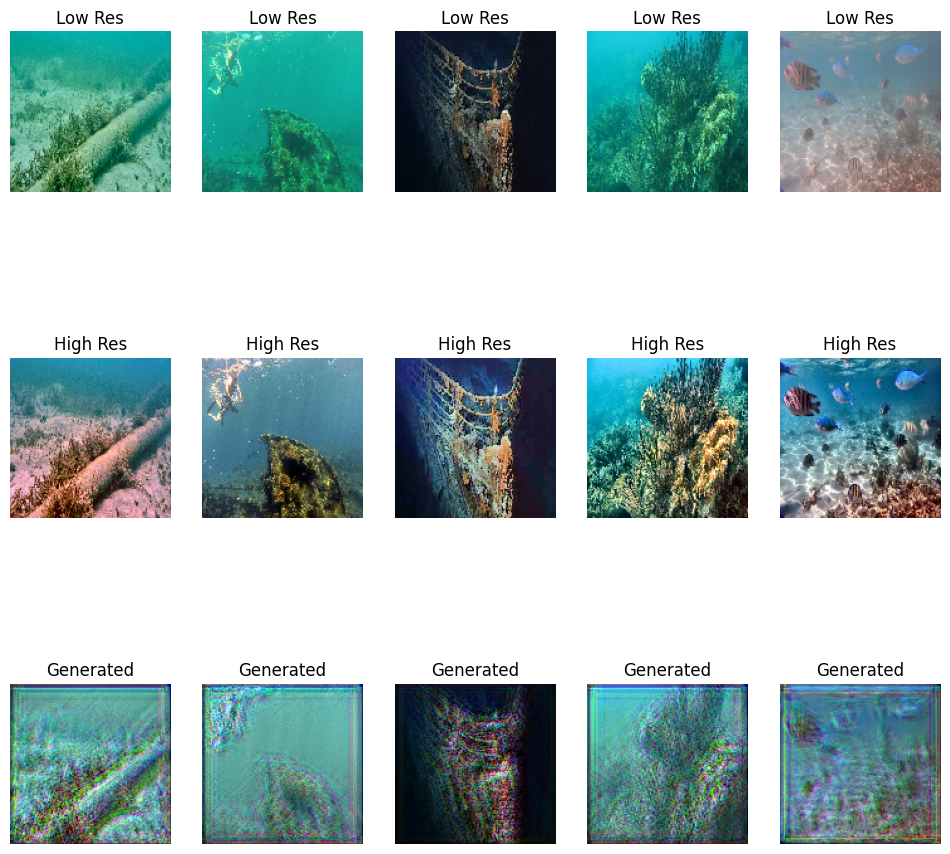

Epoch 60, Discriminator Loss: [0.5769713  0.5985774  0.6304866  0.53087115 0.6302159  0.5373887
 0.539359   0.5713957 ], Generator Loss: [0.03691942 0.03691739 0.03693322 0.03704759 0.0368304  0.03693096
 0.03692732 0.03701874]
Epoch 70, Discriminator Loss: [0.551424   0.52481174 0.57695466 0.5272489  0.45578897 0.61938334
 0.58509964 0.47217363], Generator Loss: [0.04570778 0.04570347 0.04568145 0.0455668  0.04570366 0.04602023
 0.04551138 0.04581961]
Epoch 80, Discriminator Loss: [0.6291976  0.6219543  0.4493059  0.5134789  0.6675477  0.39467782
 0.48575363 0.68397653], Generator Loss: [0.03147581 0.03109128 0.03133509 0.03104427 0.03159938 0.03193674
 0.0309754  0.03119418]
Epoch 90, Discriminator Loss: [0.45869583 0.5281807  0.57207125 0.5011062  0.53652525 0.53445286
 0.58899176 0.52002156], Generator Loss: [0.03372147 0.0340266  0.03411963 0.03330421 0.0335374  0.03360045
 0.03302085 0.03327927]
Epoch 100, Discriminator Loss: [0.62899333 0.6067889  0.5123606  0.7925837  0.6386725

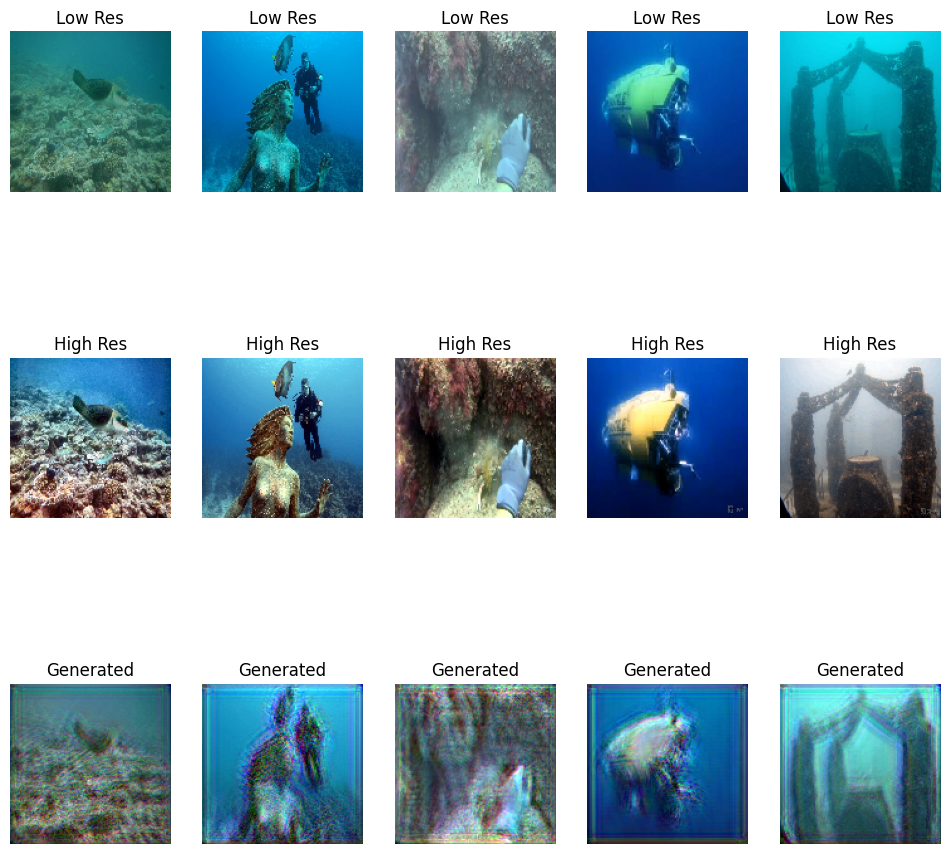

Epoch 110, Discriminator Loss: [0.77546823 0.7042479  0.749581   0.8021069  0.59844434 0.77298063
 0.83940554 0.63917774], Generator Loss: [0.02978417 0.03008764 0.02981487 0.02984958 0.03030185 0.0304037
 0.03021475 0.03010818]
Epoch 120, Discriminator Loss: [0.5113611  0.65157163 0.8694757  0.68469536 0.6677041  0.6312521
 0.7217474  0.53003454], Generator Loss: [0.03558793 0.03536792 0.03508034 0.03547172 0.03552192 0.03552505
 0.0353283  0.0356006 ]
Epoch 130, Discriminator Loss: [0.6602417  0.8036688  0.6764014  0.7656505  0.7019952  0.6651472
 0.7718514  0.76191247], Generator Loss: [0.03602929 0.03596954 0.03620137 0.0359866  0.03594717 0.03641735
 0.03631179 0.03615405]
Epoch 140, Discriminator Loss: [0.66533077 0.72232544 0.66652775 0.68205297 0.78853554 0.60181224
 0.72765344 0.6934782 ], Generator Loss: [0.03278366 0.03272407 0.03282645 0.03285056 0.03265087 0.03294758
 0.03275953 0.03281113]
Epoch 150, Discriminator Loss: [0.6857905  0.7522718  0.64616215 0.69625616 0.80636

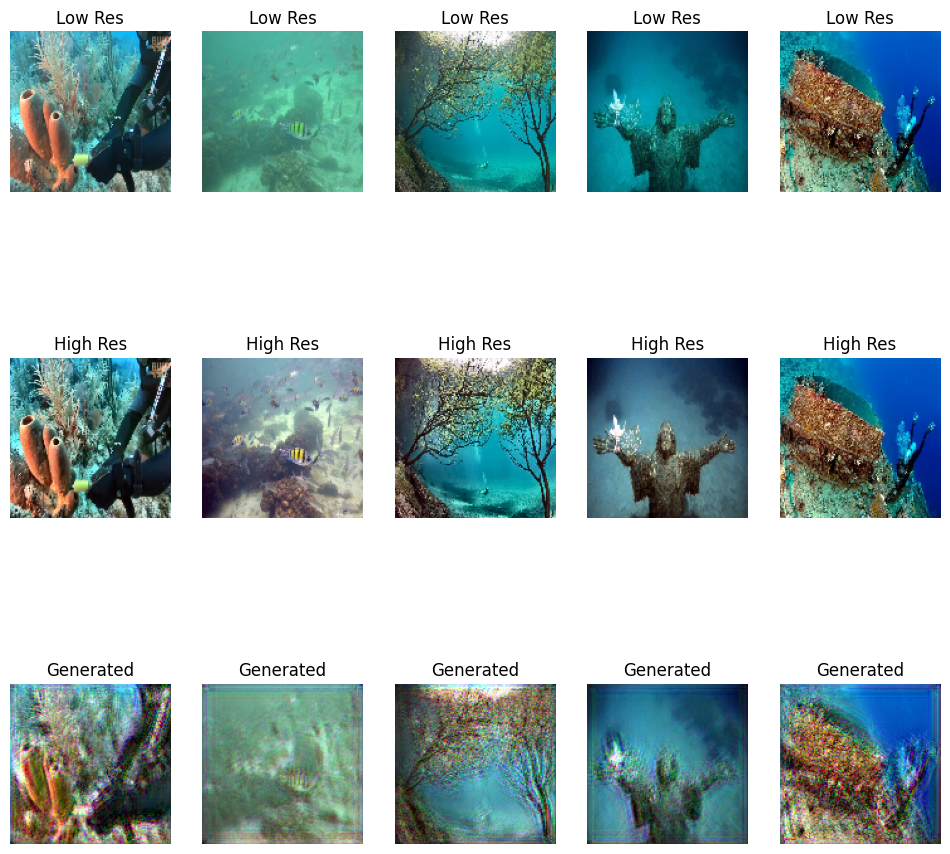

Epoch 160, Discriminator Loss: [0.7038253  0.6652105  0.77658194 0.60817397 0.80793357 0.69052947
 0.57875544 0.6951535 ], Generator Loss: [0.03131292 0.03106757 0.03120425 0.03115859 0.03100375 0.03108849
 0.03143271 0.03117581]
Epoch 170, Discriminator Loss: [0.7178287  0.568517   0.6729747  0.6383136  0.6848872  0.7469914
 0.6245245  0.73098826], Generator Loss: [0.03450592 0.03442895 0.03446627 0.03432836 0.03438853 0.03432949
 0.03440949 0.03435532]
Epoch 180, Discriminator Loss: [0.782704   0.67411333 0.6551864  0.7743254  0.59020495 0.63179374
 0.66277564 0.7781817 ], Generator Loss: [0.03014318 0.03007814 0.0303355  0.03009975 0.03015383 0.0303594
 0.03022147 0.03035964]
Epoch 190, Discriminator Loss: [0.6332319  0.6992415  0.8010409  0.74607754 0.7086546  0.6971241
 0.7046457  0.72135913], Generator Loss: [0.02557666 0.02543532 0.02581089 0.02555057 0.02563723 0.02563331
 0.02564218 0.02570245]
Epoch 200, Discriminator Loss: [0.5942049  0.74263525 0.684353   0.62241805 0.70342

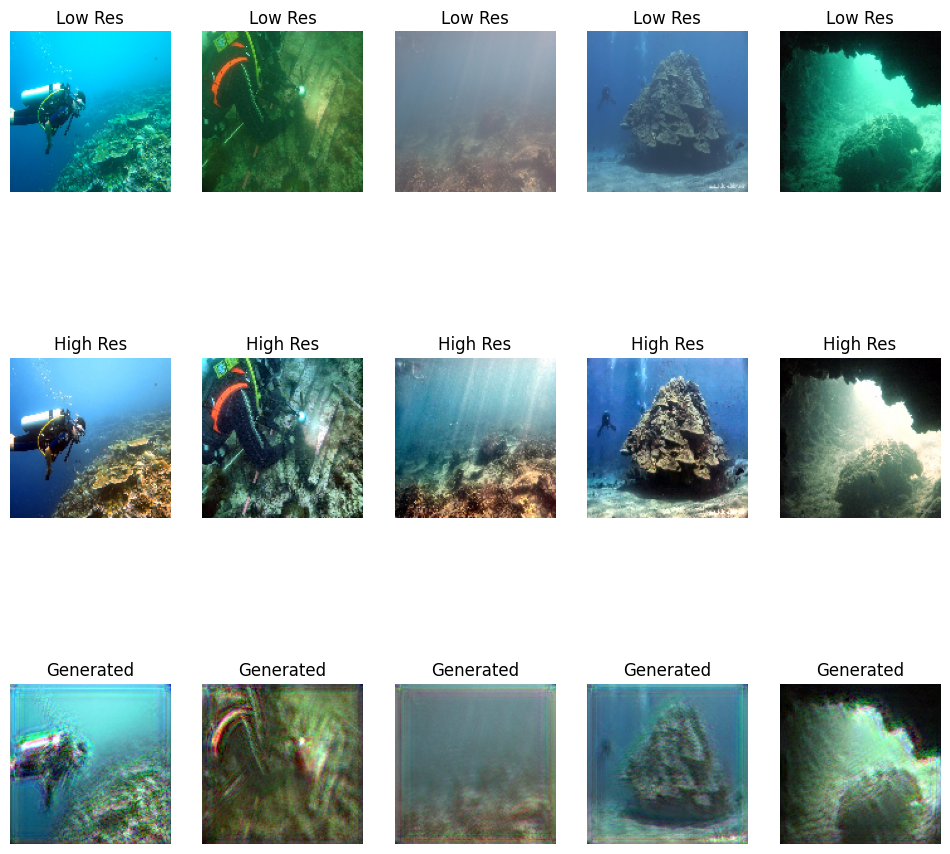

Epoch 210, Discriminator Loss: [0.7078868  0.7461264  0.6516762  0.8215244  0.7356521  0.7443335
 0.6767968  0.65805185], Generator Loss: [0.02569579 0.02569997 0.02548101 0.02571226 0.02548707 0.0257234
 0.02547368 0.02559731]
Epoch 220, Discriminator Loss: [0.5409992  0.703139   0.6695378  0.5979749  0.63467693 0.7047116
 0.665375   0.5533061 ], Generator Loss: [0.0285389  0.02889591 0.02836454 0.02854354 0.0284212  0.02839768
 0.02844287 0.02864866]
Epoch 230, Discriminator Loss: [0.65793324 0.74168843 0.6071917  0.67491996 0.61929065 0.643574
 0.6483568  0.61992586], Generator Loss: [0.02539565 0.02548394 0.02519247 0.02560969 0.02525876 0.02542909
 0.02518197 0.02533593]
Epoch 240, Discriminator Loss: [0.55333936 0.7174407  0.703631   0.75753045 0.8506948  0.6224066
 0.60719764 0.7651293 ], Generator Loss: [0.0337922  0.03357869 0.03338477 0.03345289 0.03344769 0.03368412
 0.03375847 0.0334574 ]
Epoch 250, Discriminator Loss: [0.7321153  0.5809602  0.6605006  0.52097875 0.8361452 

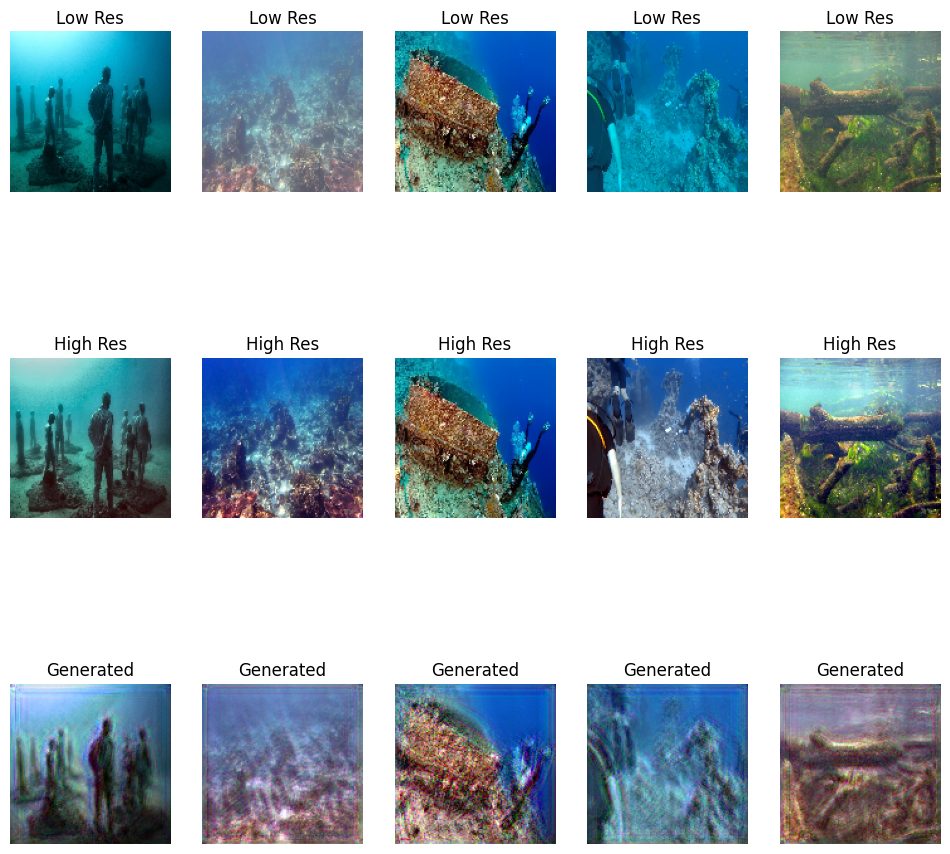

Epoch 260, Discriminator Loss: [0.62089944 0.6416456  0.7057093  0.78361297 0.596626   0.69369686
 0.6820591  0.65109956], Generator Loss: [0.02242244 0.02242317 0.02260487 0.02255543 0.02231348 0.02241865
 0.02262355 0.02247386]
Epoch 270, Discriminator Loss: [0.7745539  0.8179906  0.6561878  0.72601116 0.65495133 0.58695114
 0.538069   0.82402515], Generator Loss: [0.02262775 0.0225095  0.02250139 0.02260823 0.02254074 0.02298813
 0.02249342 0.02279949]
Epoch 280, Discriminator Loss: [0.7245705  0.46884942 0.5769522  0.84246385 0.6596141  0.82772905
 0.7569391  0.69957906], Generator Loss: [0.02528612 0.02530536 0.02560631 0.0252414  0.02510737 0.02529518
 0.02508061 0.02541047]
Epoch 290, Discriminator Loss: [0.5760811  0.6883198  0.6590129  0.6504411  0.6317884  0.64671016
 0.6331415  0.6132705 ], Generator Loss: [0.0201504  0.01999245 0.0200959  0.01995093 0.02020938 0.01996382
 0.02012478 0.02018962]
Epoch 300, Discriminator Loss: [0.7659368  0.6945802  0.69924206 0.6644908  0.74

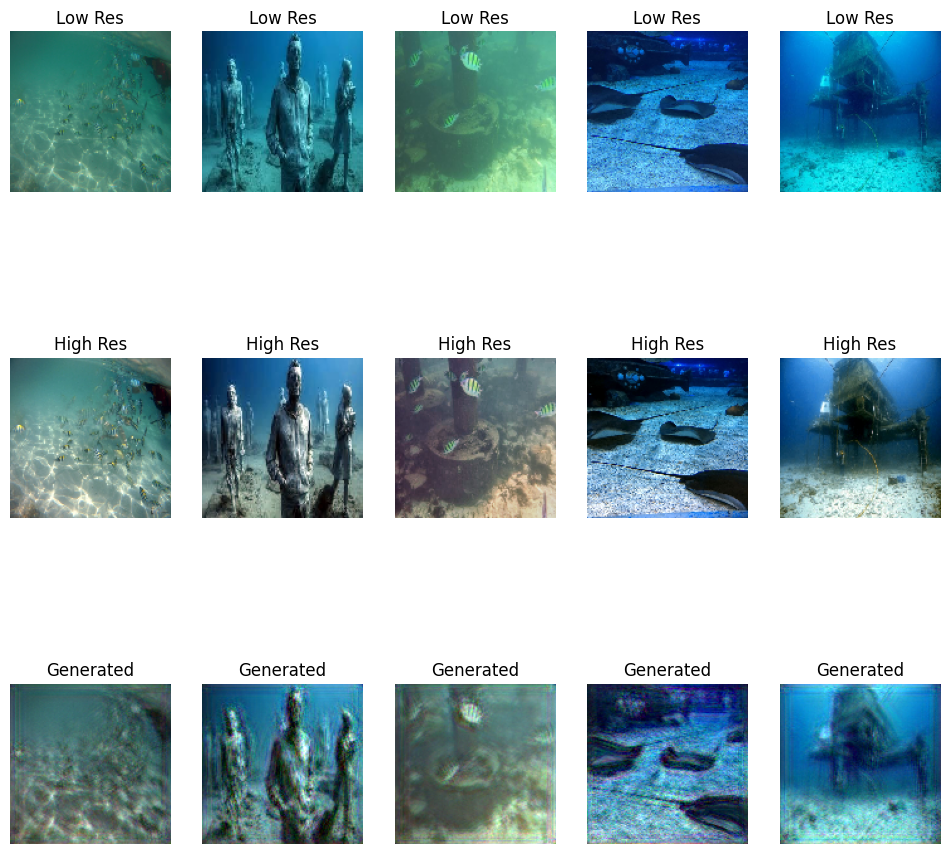

Epoch 310, Discriminator Loss: [0.7203186  0.70530415 0.6782294  0.6539527  0.42337406 0.69672513
 0.7374575  0.64839625], Generator Loss: [0.02050262 0.02004495 0.02002602 0.02050237 0.02050179 0.02010624
 0.02041369 0.02021476]
Epoch 320, Discriminator Loss: [0.83756846 0.6647431  0.71742547 0.71765924 0.4824444  0.75458634
 0.65552104 0.57500905], Generator Loss: [0.0212622  0.02117831 0.02122836 0.02117944 0.02146901 0.0214044
 0.02136279 0.02115086]
Epoch 330, Discriminator Loss: [0.49018073 0.6019819  0.6226988  0.65668905 0.639951   0.6763105
 0.6549537  0.5812561 ], Generator Loss: [0.02034211 0.02032182 0.02026852 0.02035573 0.02036836 0.02028562
 0.02036663 0.02060408]
Epoch 340, Discriminator Loss: [0.45023406 1.0118808  0.67457294 0.60638523 0.6009553  0.52296937
 0.62893665 0.48433894], Generator Loss: [0.03431467 0.03406505 0.03397273 0.03420164 0.0339691  0.0344338
 0.03408336 0.03443237]
Epoch 350, Discriminator Loss: [0.45596933 0.54227424 0.6020578  0.3353232  0.74856

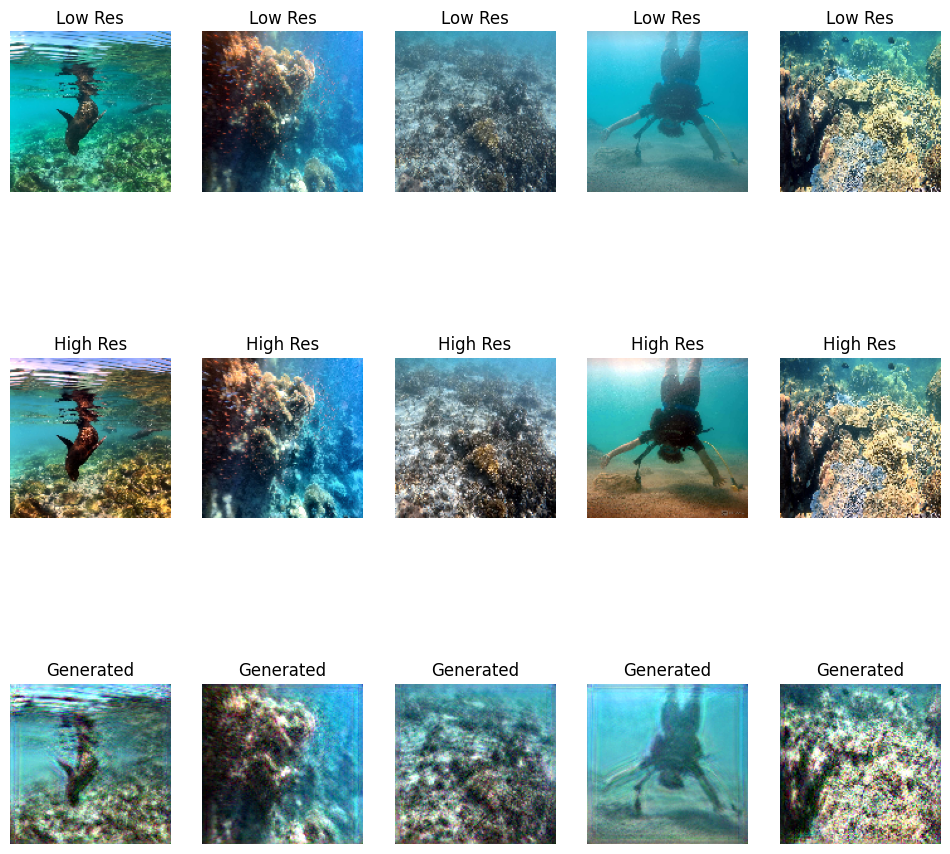

Epoch 360, Discriminator Loss: [0.8859669  0.8096234  0.6686423  0.67480636 0.57457614 0.7224337
 1.2324753  0.5525998 ], Generator Loss: [0.02990862 0.02983565 0.02996893 0.02992183 0.03036935 0.03009637
 0.02961816 0.03046946]
Epoch 370, Discriminator Loss: [0.6973825  0.45168662 0.49076948 0.86304355 0.49351963 0.44417018
 0.5634529  0.5571456 ], Generator Loss: [0.02451313 0.0239104  0.0237964  0.02341516 0.02367867 0.02369062
 0.02365767 0.02373036]
Epoch 380, Discriminator Loss: [0.5305799  0.5741089  0.6767307  0.78317845 0.63804686 0.73956925
 0.5493152  0.7169171 ], Generator Loss: [0.02001034 0.02019917 0.02019101 0.01966401 0.020165   0.01957011
 0.02013408 0.02008728]
Epoch 390, Discriminator Loss: [0.23748134 0.6955396  0.53713346 0.9350588  1.2003642  0.48613942
 0.8219143  0.7979531 ], Generator Loss: [0.02652534 0.0264396  0.02645596 0.02611897 0.02687707 0.02666408
 0.02662859 0.02567572]
Epoch 400, Discriminator Loss: [0.8176526  0.65536183 0.706674   0.475542   0.712

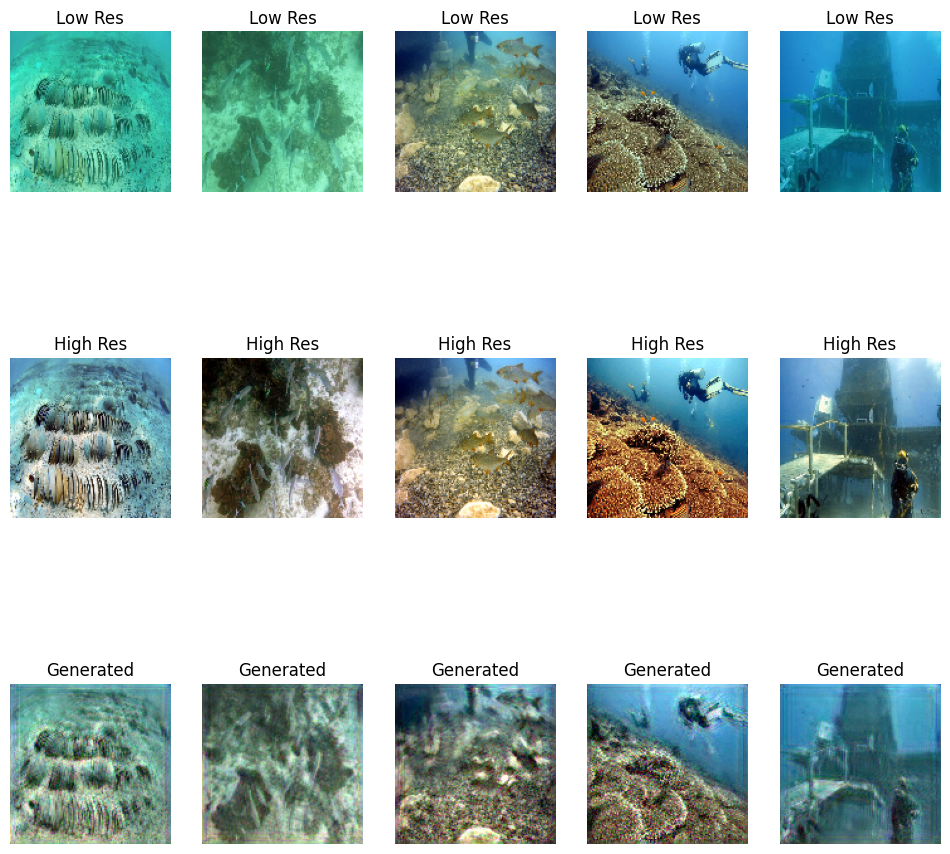

Epoch 410, Discriminator Loss: [0.43034798 0.4578365  0.85672754 0.83956635 0.5040687  0.61239505
 0.69857115 0.7148703 ], Generator Loss: [0.02055419 0.02033883 0.01995588 0.02013315 0.02044933 0.02000191
 0.02015034 0.02033448]
Epoch 420, Discriminator Loss: [0.6975617  0.50514597 0.5230231  0.15338336 0.5153602  0.58472735
 0.6884502  0.37273154], Generator Loss: [0.02866241 0.02902292 0.02882602 0.0295771  0.02938868 0.02883264
 0.02937557 0.02924633]
Epoch 430, Discriminator Loss: [0.6332056  0.661832   0.57790005 0.75851434 0.78951013 0.6778043
 0.56365746 0.6797545 ], Generator Loss: [0.02206672 0.02238382 0.02245997 0.02167943 0.02231916 0.02201143
 0.02195794 0.02170187]
Epoch 440, Discriminator Loss: [0.71132547 0.45728356 0.66646445 0.57093304 0.9388287  0.6900423
 0.49873975 0.66646445], Generator Loss: [0.02577089 0.02614841 0.02605303 0.02608894 0.0256721  0.02577489
 0.02647746 0.02605303]
Epoch 450, Discriminator Loss: [0.72797257 0.60494363 0.33288988 0.47133315 0.4235

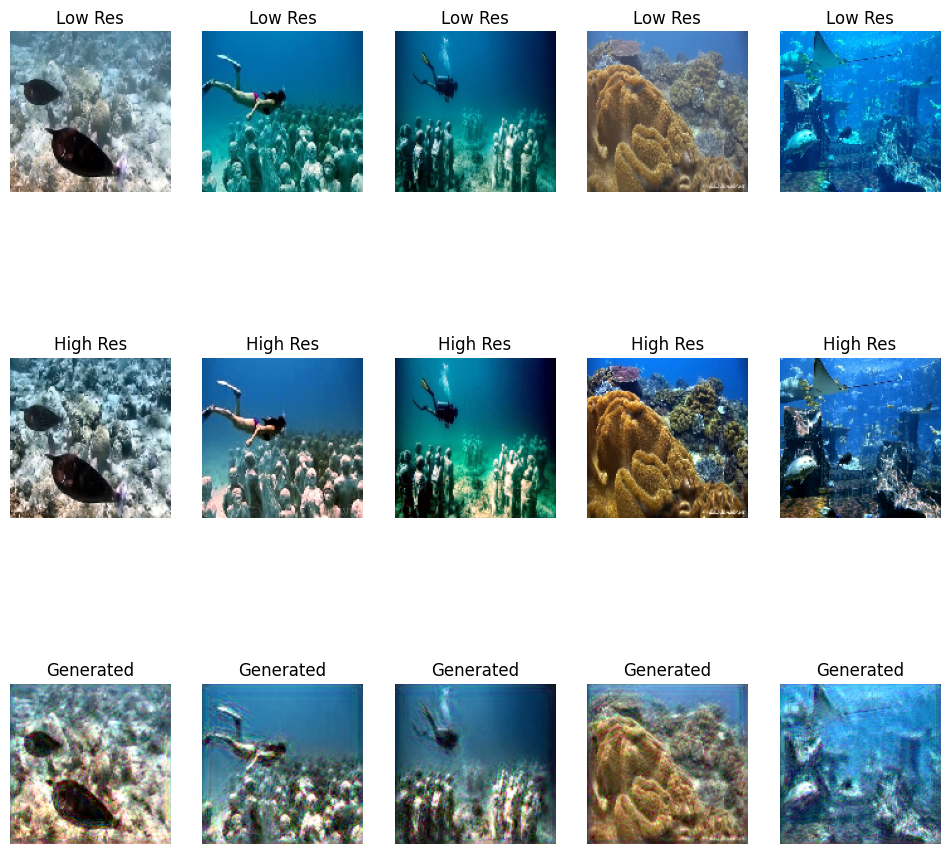

Epoch 460, Discriminator Loss: [0.6821623  0.32567006 0.45771348 0.6651232  0.2352089  0.7789451
 0.54899436 0.48796996], Generator Loss: [0.0229393  0.02307508 0.02297721 0.0230819  0.02322057 0.02289537
 0.02311475 0.02300777]
Epoch 470, Discriminator Loss: [0.2746336  0.59100395 0.46877578 0.7468134  0.23648097 0.22959337
 0.30952907 0.3836562 ], Generator Loss: [0.02651475 0.02665894 0.02660152 0.02600695 0.02656972 0.02690878
 0.02655206 0.02614911]
Epoch 480, Discriminator Loss: [0.6332936  0.6207261  0.53026575 0.4383794  0.5032268  0.68972677
 0.6234405  0.3738047 ], Generator Loss: [0.03353262 0.0330168  0.03370879 0.03359178 0.03357822 0.03330541
 0.03326058 0.0336316 ]
Epoch 490, Discriminator Loss: [0.66240907 0.39959523 0.37178424 0.7108594  0.7924142  0.58405465
 0.8302406  0.347269  ], Generator Loss: [0.02986548 0.03000985 0.03024238 0.03018931 0.0305757  0.02991673
 0.0302825  0.0301849 ]


In [17]:
srgan.train(epochs=500, batch_size=8)

In [18]:
# Save the generator model after training
generator.save('srgan_generator.keras')


In [24]:
tf.keras.backend.clear_session()

In [19]:
generator = tf.keras.models.load_model('srgan_generator.keras', compile=False)

# Paths to test images
test_raw_images_path = "/kaggle/input/underwater3/Test/Raw"
test_reference_images_path = "/kaggle/input/underwater3/Test/Reference"

# Load test images
def load_test_images(raw_path, reference_path):
    raw_images = []
    reference_images = []

    for filename in os.listdir(raw_path):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            raw_image = tf.keras.preprocessing.image.load_img(os.path.join(raw_path, filename), target_size=(128, 128))
            raw_image = tf.keras.preprocessing.image.img_to_array(raw_image) / 255.0  # Normalize
            raw_images.append(raw_image)

            reference_image = tf.keras.preprocessing.image.load_img(os.path.join(reference_path, filename), target_size=(128, 128))
            reference_image = tf.keras.preprocessing.image.img_to_array(reference_image) / 255.0  # Normalize
            reference_images.append(reference_image)

    return np.array(raw_images), np.array(reference_images)

test_raw_images, test_reference_images = load_test_images(test_raw_images_path, test_reference_images_path)

# Predict high-resolution images
predicted_hr_images = generator.predict(test_raw_images)

I0000 00:00:1728625918.581762     102 service.cc:145] XLA service 0x7ac938058000 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1728625918.581819     102 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1728625918.581825     102 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


1/6 ━━━━━━━━━━━━━━━━━━━━ 20s 4s/step

I0000 00:00:1728625922.138061     102 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step  


In [22]:
from skimage.metrics import structural_similarity as ssim

def calculate_metrics(reference_images, generated_images):
    total_mse, total_psnr, total_ssim = 0, 0, 0
    for i in range(reference_images.shape[0]):
        mse_value = np.mean((reference_images[i] - generated_images[i]) ** 2)
        total_mse += mse_value

        psnr_value = 10.0 * np.log10(mse_value)
        total_psnr += psnr_value

        # Use win_size of 3 and specify the data_range
        data_range = 1.0 if np.max(reference_images) <= 1 else 255.0  # Adjust based on your image range
        ssim_value = ssim(reference_images[i], generated_images[i], 
                          channel_axis=2, win_size=3, data_range=data_range)  
        total_ssim += abs(ssim_value)

    mse_avg = total_mse / reference_images.shape[0]
    psnr_avg = total_psnr / reference_images.shape[0]
    ssim_avg = total_ssim / reference_images.shape[0]

    return mse_avg, psnr_avg, ssim_avg

mse, psnr, ssim_val = calculate_metrics(test_reference_images, predicted_hr_images)
print(f"Average MSE: {mse}, Average PSNR: {psnr}, Average SSIM: {ssim_val}")
# Display predictions


Average MSE: 6.588737473362371, Average PSNR: 7.699810653042636, Average SSIM: 0.01767089278306996
